In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
import plotly.graph_objects as go

In [2]:
# Plotting in 3D
def plot_3D(x, y, z, colorscale, title):
    fig = go.Figure(data=[go.Scatter3d(
        x=x,
        y=y,
        z=z,
        mode='markers',
        marker=dict(size=1, color=z, colorscale=colorscale, opacity=0.8)
    )])

    fig.update_layout(
        title=title,
        scene=dict(
            xaxis=dict(title='X axis'),
            yaxis=dict(title='Y axis'),
            zaxis=dict(title='Z axis'),
            camera=dict(
                eye=dict(x=0, y=0, z=-1.5),
                up=dict(x=0, y=0, z=0)
            )
        ),
    )

    fig.show()

In [3]:
# Saving the coordinates as PCD
def save_pcd(x, y, z, save_path):
  coordinates = {
      'x': x,
      'y': y,
      'z': z
  }
  pcd = pd.DataFrame(coordinates)

  pcd.to_csv(save_path, index=False)

In [4]:
# Camera Parameters
f_x = 398.7956237792969 # Focal length in the x direction
f_y = 398.7956237792969 # Focal length in the y direction
s   =   0.0             # Skew coefficient
c_x = 315.4751892089844 # Principal point x-coordinate
c_y = 205.1688232421875 # Principal point y-coordinate
b   =   0.075           # Baseline distance

In [5]:
# Intrinsic Matrix
K = np.array([
            [f_x,   s, c_x],
            [  0, f_y, c_y],
            [  0,   0,   1]
            ])

In [6]:
# Rotation
R = np.array([
            [ 0.0,  0.0,  1.0],
            [-1.0,  0.0,  0.0],
            [ 0.0, -1.0,  0.0]
            ])

# Translation
T = np.array([0.28, 0.0375, 0.28])

# Homogeneous Transformation
H = np.eye(4)
H[:3, :3] = R
H[:3, 3] = T

In [7]:
# Load disparity image
input_path = 'Disparity.png'
d = cv2.imread(input_path, cv2.IMREAD_GRAYSCALE)

In [8]:
d_max = 7 # Adjust the maximum depth as required
Z = np.where(d < d_max, np.nan, (f_x * b) / d) # Taking baseline is along x direction

<ipython-input-8-81853e42705a>:2: RuntimeWarning: divide by zero encountered in divide
  Z = np.where(d < d_max, np.nan, (f_x * b) / d) # Taking baseline is along x direction


In [9]:
idx = np.where(~np.isnan(Z)) # Getting valid indices

# Getting coordinates of points
z = Z[idx]
y, x = idx

In [10]:
save_pcd(x, y, z, 'pcd_world.csv')

In [11]:
plot_3D(x, y, z, 'viridis', '3D PCD Visualization')

In [12]:
# Camera point of view
x = (x - c_x) * z / f_x
y = (y - c_y) * z / f_y

In [13]:
save_pcd(x, y, z, 'pcd_camera.csv')

In [14]:
plot_3D(x, y, z, 'plasma', '3D PCD Camera View')

In [15]:
# Camera frame to Robot  frame
pcd_camera = np.column_stack((x, y, z))
ones = np.ones((pcd_camera.shape[0], 1))
pcd_robot = (np.hstack((pcd_camera, ones)) @ H.T)[:, :-1]

In [16]:
# Retrieving coordinates
x = pcd_robot[:, 0]
y = pcd_robot[:, 1]
z = pcd_robot[:, 2]

In [17]:
save_pcd(x, y, z, 'pcd_robot.csv')

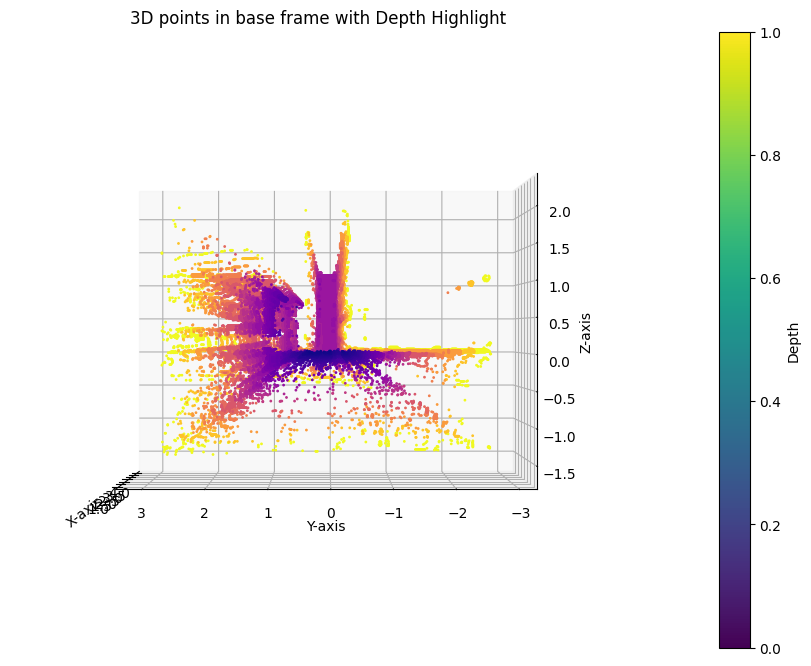

In [18]:
# Plotting result
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

sc = ax.scatter(x, y, z, c=x, cmap='plasma', s=1, alpha=1.0)

sc_bar = ax.scatter([], [], [], c=[], cmap='viridis')
cbar = plt.colorbar(sc_bar, ax=ax, pad=0.1)
cbar.set_label('Depth')

ax.set_title("3D points in base frame with Depth Highlight")
ax.set_xlabel('X-axis')
ax.set_ylabel('Y-axis')
ax.set_zlabel('Z-axis')

ax.view_init(elev=0, azim=180)

plt.show()